<a href="https://colab.research.google.com/github/ricoprediansyah/CV-FASTER_RCNN_RESNET_COUNT_PALM_TREES_IMAGE_QUALITY_PT_SAMPOERNA_AGRO/blob/main/IMAGE_QUALITY_FASTER_RCNN_RESNET152_COUNT_PALM_TREES_CROP_SAMPOERNA_AGRO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##DATASET

In [ ]:
import torch

if torch.cuda.is_available():
    device = torch.device("cuda")
    print('There are %d GPU(s) available.' % torch.cuda.device_count())
    print('We will use the GPU:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="PZMfN1gExhcqfGkkkd43")
project = rf.workspace("cryospace-yylkk").project("palm-tree-label-200m-splitted")
version = project.version(4)
dataset = version.download("voc")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 2.1 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Palm-Tree-Label-200m-Splitted-4 in voc:: 100%|██████████| 869/869 [00:03<00:00, 219.46it/s]


In [ ]:
# Membuat folder images dan annotations
!mkdir -p images annotations

In [ ]:
import os
import shutil

# Daftar folder sumber
folders = ['/content/Palm-Tree-Label-200m-Splitted-4/test', '/content/Palm-Tree-Label-200m-Splitted-4/train', '/content/Palm-Tree-Label-200m-Splitted-4/valid']

# Membuat folder tujuan jika belum ada
os.makedirs('/content/images', exist_ok=True)
os.makedirs('/content/annotations', exist_ok=True)

# Memindahkan file berdasarkan ekstensi
for folder in folders:
    for filename in os.listdir(folder):
        file_path = os.path.join(folder, filename)

        # Memindahkan file .xml ke /content/annotations
        if filename.endswith('.xml'):
            shutil.move(file_path, '/content/annotations/')

        # Memindahkan file .png, .jpg, atau .jpeg ke /content/images
        elif filename.endswith(('.png', '.jpg', '.jpeg')):
            shutil.move(file_path, '/content/images/')

In [ ]:
import os
import random
import numpy as np
import shutil

# Menghitung dan mencetak jumlah file di folder annotations dan images
print(f'Jumlah file di annotations: {len(os.listdir("annotations"))}')
print(f'Jumlah file di images: {len(os.listdir("images"))}')

# Membuat folder test_images dan test_annotations
os.makedirs('test_images', exist_ok=True)
os.makedirs('test_annotations', exist_ok=True)

# Mengatur seed untuk reproducibility
random.seed(1234)

# Menghitung jumlah dataset
total_data = 432
test_data_count = int(0.15 * total_data)  # 15% dari total_data

# Mengambil indeks secara acak untuk 15% data
idx = random.sample(range(total_data), test_data_count)

# Memindahkan file gambar ke test_images
for img in np.array(sorted(os.listdir('images')))[idx]:
    shutil.move(os.path.join('images', img), os.path.join('test_images', img))

# Memindahkan file anotasi ke test_annotations
for annot in np.array(sorted(os.listdir('annotations')))[idx]:
    shutil.move(os.path.join('annotations', annot), os.path.join('test_annotations', annot))

# Menghitung dan mencetak jumlah file setelah pemindahan
print(f'Jumlah file di annotations setelah pemindahan: {len(os.listdir("annotations"))}')
print(f'Jumlah file di images setelah pemindahan: {len(os.listdir("images"))}')
print(f'Jumlah file di test_annotations: {len(os.listdir("test_annotations"))}')
print(f'Jumlah file di test_images: {len(os.listdir("test_images"))}')

Jumlah file di annotations: 432
Jumlah file di images: 432
Jumlah file di annotations setelah pemindahan: 368
Jumlah file di images setelah pemindahan: 368
Jumlah file di test_annotations: 64
Jumlah file di test_images: 64


In [ ]:
import os
import numpy as np
import matplotlib.patches as patches
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
from PIL import Image
import torchvision
from torchvision import transforms, datasets, models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import time

In [ ]:
def generate_box(obj):
    xmin = float(obj.find('xmin').text)
    ymin = float(obj.find('ymin').text)
    xmax = float(obj.find('xmax').text)
    ymax = float(obj.find('ymax').text)

    return [xmin, ymin, xmax, ymax]

In [ ]:
adjust_label = 0

def generate_label(obj):
    # Mengembalikan label 1 untuk class "Palm-Trees"
    if obj.find('name').text == "Palm-Tree":
        return 1 + adjust_label

    # Jika class tidak dikenali, kembalikan 0
    return 0 + adjust_label

In [ ]:
def generate_target(file):
    with open(file) as f:
        data = f.read()
        soup = BeautifulSoup(data, "html.parser")
        objects = soup.find_all("object")

        num_objs = len(objects)

        boxes = []
        labels = []
        for i in objects:
            boxes.append(generate_box(i))
            labels.append(generate_label(i))

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels

        return target

In [ ]:
def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='r',facecolor='none')

        else :

            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
class MaskDataset(object):
    def __init__(self, transforms, path):
        '''
        path: path to train folder or test folder
        '''
        # define the path to the images and what transform will be used
        self.transforms = transforms
        self.path = path
        self.imgs = list(sorted(os.listdir(self.path)))


    def __getitem__(self, idx): #special method
        # load images ad masks
        file_image = self.imgs[idx]
        file_label = self.imgs[idx][:-3] + 'xml'
        img_path = os.path.join(self.path, file_image)

        if 'test' in self.path:
            label_path = os.path.join("test_annotations/", file_label)
        else:
            label_path = os.path.join("annotations/", file_label)

        img = Image.open(img_path).convert("RGB")
        #Generate Label
        target = generate_target(label_path)

        if self.transforms is not None:
            img = self.transforms(img)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [ ]:
data_transform = transforms.Compose([  # transforms.Compose : a class that calls the functions in a list consecutively
        transforms.ToTensor() # ToTensor : convert numpy image to torch.Tensor type
    ])

def collate_fn(batch):
    return tuple(zip(*batch))

dataset = MaskDataset(data_transform, 'images/')
test_dataset = MaskDataset(data_transform, 'test_images/')

data_loader = torch.utils.data.DataLoader(dataset, batch_size=4, collate_fn=collate_fn)
test_data_loader = torch.utils.data.DataLoader(test_dataset, batch_size=2, collate_fn=collate_fn)

##LOAD MODEL AND TRAINING

In [ ]:
import torch
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone

def get_model_instance_segmentation(num_classes, max_detections=1000):
    # Load ResNet18 backbone with FPN
    backbone = resnet_fpn_backbone('resnet152', pretrained=True)

    # Create Faster R-CNN model using the custom backbone
    model = FasterRCNN(backbone, num_classes=num_classes)

    # Set the maximum number of detections per image
    model.roi_heads.detections_per_img = max_detections

    return model

In [ ]:
# Instansiasi model dengan 2 kelas (Palm Tree + Background) dan set max 300 deteksi per gambar
model = get_model_instance_segmentation(2, max_detections=1000)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model.to(device)

Using 'backbone_name' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /root/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth
100%|██████████| 230M/230M [00:01<00:00, 178MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu

In [ ]:
torch.cuda.is_available()

True

In [ ]:
num_epochs = 15
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

In [ ]:
print('----------------------train start--------------------------')
for epoch in range(num_epochs):
    start = time.time()
    model.train()
    i = 0
    epoch_loss = 0
    for imgs, annotations in data_loader:
        i += 1
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        loss_dict = model(imgs, annotations)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        epoch_loss += losses
    print(f'epoch : {epoch+1}, Loss : {epoch_loss}, time : {time.time() - start}')

----------------------train start--------------------------
epoch : 1, Loss : 123.07759857177734, time : 139.5287401676178
epoch : 2, Loss : 75.5256576538086, time : 137.82611727714539
epoch : 3, Loss : 66.17469787597656, time : 140.46682810783386
epoch : 4, Loss : 62.34381103515625, time : 141.01480722427368
epoch : 5, Loss : 60.056575775146484, time : 140.85602617263794
epoch : 6, Loss : 57.86366271972656, time : 140.08482384681702
epoch : 7, Loss : 55.23288345336914, time : 140.99544429779053
epoch : 8, Loss : 53.55768585205078, time : 140.1003875732422
epoch : 9, Loss : 52.543643951416016, time : 141.25671648979187
epoch : 10, Loss : 50.95307922363281, time : 141.43823909759521
epoch : 11, Loss : 50.12205123901367, time : 141.25353074073792
epoch : 12, Loss : 49.15192794799805, time : 139.60162949562073
epoch : 13, Loss : 47.8642463684082, time : 141.11704683303833
epoch : 14, Loss : 47.183353424072266, time : 139.57459807395935
epoch : 15, Loss : 46.91822052001953, time : 140.6680

In [ ]:
torch.save(model.state_dict(),f'model_{num_epochs}.pt')

In [ ]:
model.load_state_dict(torch.load(f'model_{num_epochs}.pt'))

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


<All keys matched successfully>

##TEST AND EVALUATION

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

In [ ]:
with torch.no_grad():
    # batch size of the test set = 2
    for imgs, annotations in test_data_loader:
        imgs = list(img.to(device) for img in imgs)

        pred = make_prediction(model, imgs, 0.5)
        print(pred)
        break

[{'boxes': tensor([[1.2636e+03, 9.5509e+02, 1.3897e+03, 1.1152e+03],
        [2.2630e+01, 7.2413e+02, 1.5140e+02, 8.9239e+02],
        [8.3733e+02, 6.1518e+02, 9.7212e+02, 7.7368e+02],
        [1.0258e+03, 1.0384e+03, 1.1682e+03, 1.2151e+03],
        [1.5865e+03, 4.1569e+02, 1.7235e+03, 5.6405e+02],
        [9.1215e+02, 7.4604e+02, 1.0469e+03, 9.1897e+02],
        [2.2246e+02, 1.0746e+03, 3.4317e+02, 1.2266e+03],
        [4.1175e+02, 1.2147e+03, 5.5941e+02, 1.3631e+03],
        [7.1437e+02, 3.0215e+02, 8.4219e+02, 4.5033e+02],
        [1.0370e+03, 7.4725e+02, 1.1727e+03, 9.1523e+02],
        [1.1237e+03, 6.1016e+02, 1.2544e+03, 7.4622e+02],
        [1.3364e+02, 9.6462e+02, 2.7072e+02, 1.1193e+03],
        [1.2567e+03, 6.2604e+02, 1.4008e+03, 7.6966e+02],
        [5.4604e+02, 1.8374e+02, 6.7844e+02, 3.3644e+02],
        [1.4181e+03, 6.1070e+02, 1.5574e+03, 7.7029e+02],
        [1.8586e+02, 1.5753e+03, 3.1362e+02, 1.7435e+03],
        [1.4655e+03, 7.4820e+02, 1.5842e+03, 9.0217e+02],
   

Target (Ground Truth):  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


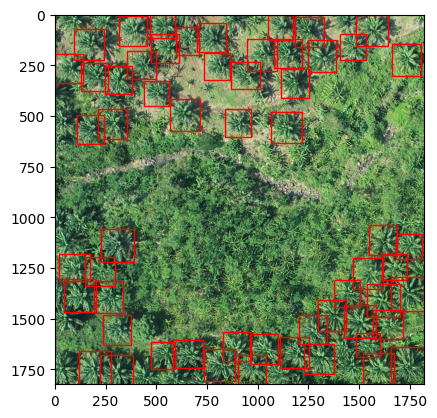

Prediction:  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


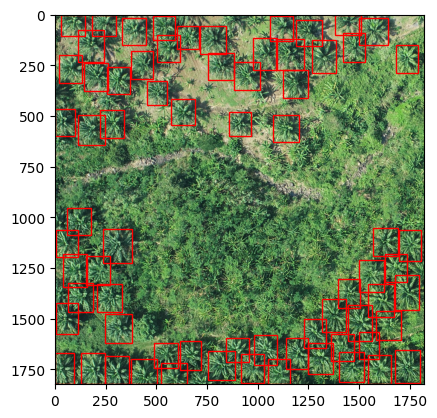

Jumlah label ground truth: 57
Jumlah label hasil prediksi: 59
Accuracy: 103.51%


In [ ]:
# Tentukan threshold untuk confidence score
threshold = 0.91
# GPU index untuk data yang digunakan
_idx = 1

# Pastikan tensor diubah menjadi numpy setelah dipindahkan ke CPU
print("Target (Ground Truth): ", annotations[_idx]['labels'].cpu().numpy())  # Pindahkan labels ke CPU sebelum dicetak

# Pindahkan gambar ke CPU untuk visualisasi
imgs_cpu = imgs[_idx].cpu()

# Pindahkan setiap tensor di dalam annotations (ground truth) ke CPU
annotations_cpu = {k: v.cpu().numpy() for k, v in annotations[_idx].items()}

# Visualisasikan gambar dan anotasi (ground truth)
plot_image_from_output(imgs_cpu, annotations_cpu)

# Pindahkan prediksi ke CPU
pred_cpu = {k: v.cpu().numpy() for k, v in pred[_idx].items()}

# Visualisasikan gambar dan prediksi
print("Prediction: ", pred_cpu['labels'])
plot_image_from_output(imgs_cpu, pred_cpu)

# Hitung label ground truth dan prediksi
ground_truth_labels = annotations[_idx]['labels'].cpu().numpy()
predicted_labels = pred_cpu['labels']

# Filter prediksi berdasarkan threshold
valid_indices = np.where(pred_cpu['scores'] >= threshold)[0]
predicted_labels = predicted_labels[valid_indices]

# Jumlah label asli (ground truth) dan hasil prediksi
print(f"Jumlah label ground truth: {len(ground_truth_labels)}")
print(f"Jumlah label hasil prediksi: {len(predicted_labels)}")

# Menghitung akurasi dengan membagi jumlah label hasil prediksi dengan jumlah label ground truth
accuracy = len(predicted_labels) / len(ground_truth_labels) * 100 if len(ground_truth_labels) > 0 else 0
print(f"Accuracy: {accuracy:.2f}%")


In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_data_loader, position = 0, leave = True):
    im = list(img.to(device) for img in im)

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)

100%|██████████| 32/32 [00:20<00:00,  1.60it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 19 (delta 5), pack-reused 0 (from 0)
Receiving objects: 100% (45/45), 11.63 KiB | 11.63 MiB/s, done.
Resolving deltas: 100% (18/18), done.


In [ ]:
!mv /content/Tutorial-Book-Utils/utils_ObjectDetection.py /content/

In [ ]:
import utils_ObjectDetection as utils

# Menghitung True Positives, pred_scores, dan pred_labels dari batch statistics
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]

# Menghitung Precision, Recall, dan F1 Score
precision, recall, ap, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))

# Menghitung Akurasi
total_detections = true_positives.shape[0]  # Jumlah semua prediksi (TP + FP)
TP_sum = true_positives.sum()  # Jumlah True Positives
accuracy = TP_sum / total_detections  # Akurasi = TP / (TP + FP)

# Output hasil evaluasi
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1-score: {f1}')
print(f'Accuracy: {accuracy.item()}')

Precision: tensor([0.9452])
Recall: tensor([0.9731])
F1-score: tensor([0.9589])
Accuracy: 0.9451709389686584


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # all the batches get concatenated
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.9647471572063966
AP : tensor([0.9647], dtype=torch.float64)


In [ ]:
# Hitung True Positives, pred_scores, dan pred_labels dari batch statistics
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]

# Menghitung Precision, Recall, dan F1 Score
precision, recall, ap, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))

# Menghitung Akurasi
total_detections = true_positives.shape[0]  # Jumlah semua prediksi (TP + FP)
TP_sum = true_positives.sum()  # Jumlah True Positives
accuracy = TP_sum / total_detections if total_detections > 0 else 0  # Akurasi = TP / (TP + FP)


# Menghitung Mean Squared Error (MSE) dan Root Mean Squared Error (RMSE)
def calculate_mse_rmse(pred_scores, true_labels):
    """ Menghitung MSE dan RMSE """
    if len(pred_scores) != len(true_labels):
        raise ValueError("Jumlah prediksi dan jumlah label harus sama.")

    # Menghitung MSE
    mse = torch.mean((pred_scores - true_labels) ** 2)
    rmse = torch.sqrt(mse)

    return mse.item(), rmse.item()

# Filter pred_scores dan true_labels untuk memastikan ukurannya sama
valid_indices = true_positives.nonzero(as_tuple=True)[0]  # Ambil indeks True Positives

# Memastikan filtered_pred_scores dan filtered_true_labels memiliki ukuran yang sama
if len(valid_indices) > 0:
    filtered_pred_scores = pred_scores[valid_indices]

    # Ambil true labels yang sesuai dengan pred_labels
    filtered_true_labels = pred_labels[valid_indices]

    # Hitung MSE dan RMSE
    mse, rmse = calculate_mse_rmse(filtered_pred_scores, filtered_true_labels)

    # Output hasil MSE dan RMSE
    print(f'Mean Squared Error (MSE): {mse}')
    print(f'Root Mean Squared Error (RMSE): {rmse}')
else:
    print("Tidak ada True Positives yang ditemukan.")


Mean Squared Error (MSE): 0.002963119884952903
Root Mean Squared Error (RMSE): 0.05443454533815384


#PREDIKSI NEW DATA

crop angka menjadi persentase

In [ ]:
# Lebar total gambar (harus diketahui sebelumnya)
total_width = 9554  # Sesuai dengan nilai akhir di crop_widths

# Daftar koordinat crop
crop_widths = [(0, 1111), (1111, 2337), (2337, 3500), (3500, 4500),
               (4500, 6020), (6020, 7160), (7160, 8370), (8370, 9554)]

# Fungsi untuk menghitung persentase cropping
def calculate_crop_percentages(crop_widths, total_width):
    percentages = []
    for start, end in crop_widths:
        segment_width = end - start
        percentage = segment_width / total_width
        percentages.append(percentage)
    return percentages

# Hitung persentase untuk setiap crop
crop_percentages = calculate_crop_percentages(crop_widths, total_width)
print("Persentase cropping:", crop_percentages)

# Verifikasi total persentase (seharusnya mendekati 1.0)
print("Total persentase:", sum(crop_percentages))

Persentase cropping: [0.1162863722001256, 0.1283232154071593, 0.12172911869374084, 0.10466820180029307, 0.15909566673644546, 0.1193217500523341, 0.12664852417835462, 0.12392715093154699]
Total persentase: 1.0


### [2637] CUSTOM 8 CROP VERY GOOD QUALITY

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


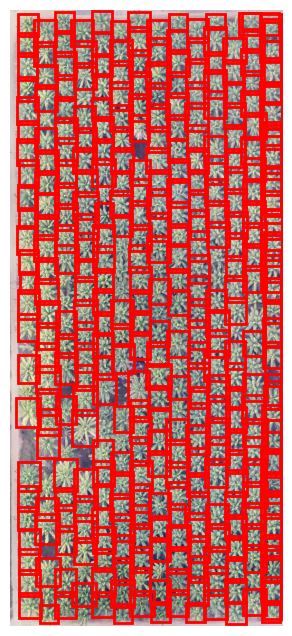

Jumlah objek terdeteksi pada crop 359: 359


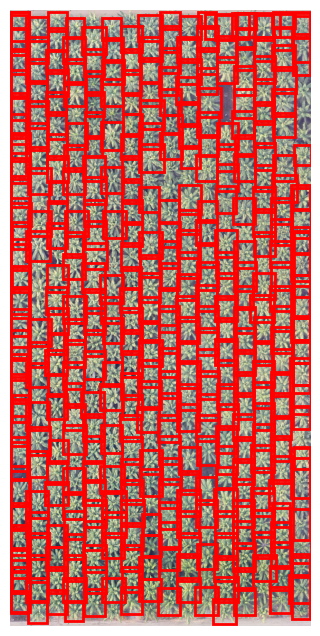

Jumlah objek terdeteksi pada crop 414: 414


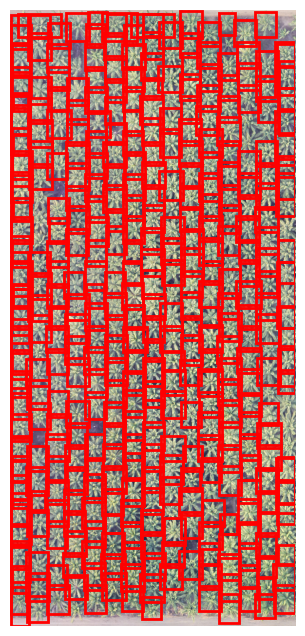

Jumlah objek terdeteksi pada crop 388: 388


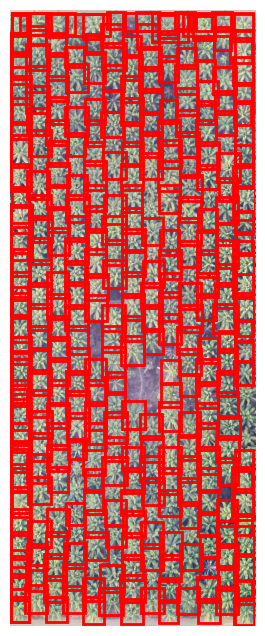

Jumlah objek terdeteksi pada crop 340: 340


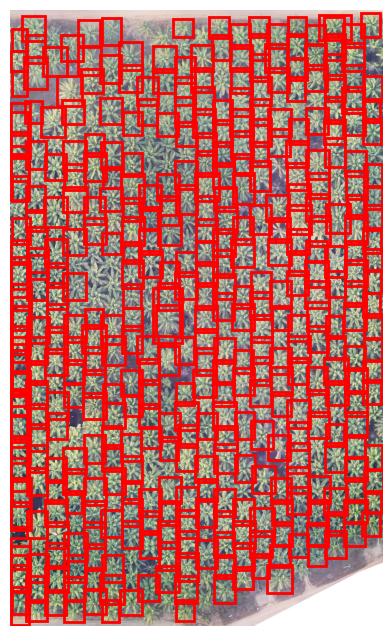

Jumlah objek terdeteksi pada crop 410: 410


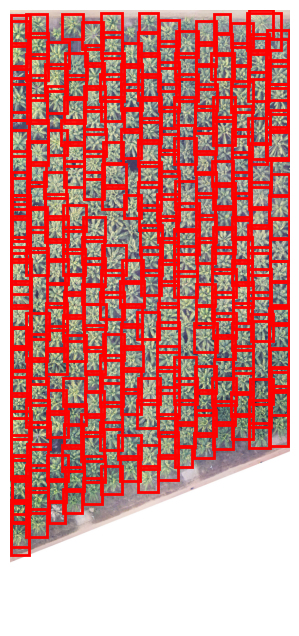

Jumlah objek terdeteksi pada crop 293: 293


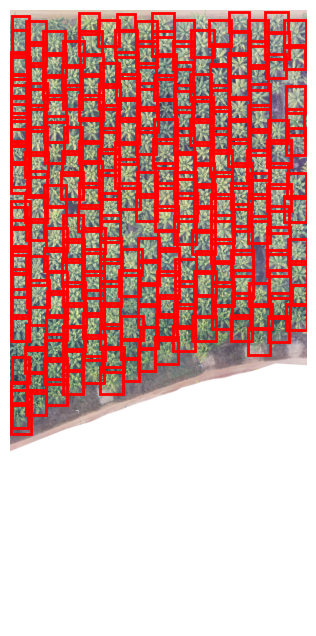

Jumlah objek terdeteksi pada crop 242: 242


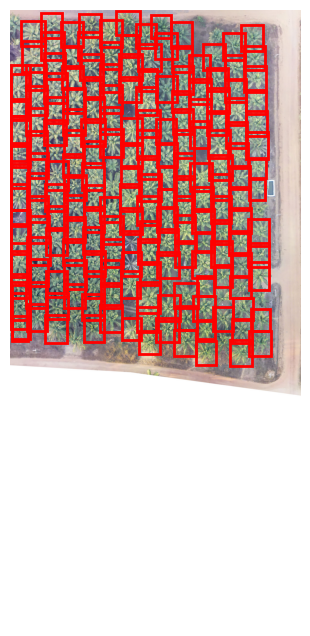

Jumlah objek terdeteksi pada crop 191: 191
Total jumlah objek terdeteksi pada semua crop: 2637


In [ ]:
# Fungsi untuk menghitung crop berdasarkan persentase
def calculate_crop_widths(image_width, percentages):
    crop_widths = []
    start = 0
    for percentage in percentages:
        end = start + int(image_width * percentage)
        crop_widths.append((start, end))
        start = end
    return crop_widths

# Persentase untuk cropping (total harus 1.0)
crop_percentages = [0.1162863722001256, 0.1283232154071593, 0.12172911869374084, 0.10466820180029307, 0.15909566673644546, 0.1193217500523341, 0.12664852417835462, 0.12392715093154699]

# Memuat gambar dan mengurangi resolusi jika terlalu besar
img_path = '/content/SAWIT MESUJI - Very Good 14904x3916.jpg'
image = Image.open(img_path).convert("RGB")

# Menghitung lebar cropping berdasarkan persentase
crop_widths = calculate_crop_widths(image.width, crop_percentages)

# Fungsi untuk memvisualisasikan gambar dengan kotak prediksi
def plot_image_with_boxes(image, boxes, labels):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        # Menghilangkan label angka, cukup menampilkan string kosong
        ax.text(xmin, ymin, '', fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Menaikkan batas maksimal ukuran gambar untuk mencegah DecompressionBombError
Image.MAX_IMAGE_PIXELS = None

# Fungsi untuk memotong gambar menjadi bagian-bagian
def crop_image(image, crop_widths):
    crops = []
    for start, end in crop_widths:
        cropped_img = image.crop((start, 0, end, image.height))
        crops.append(cropped_img)
    return crops

# Crop gambar
crops = crop_image(image, crop_widths)

# Konversi gambar menjadi tensor
transform = transforms.ToTensor()
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Pastikan model sudah dimuat dan berada dalam mode eval
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_15.pt'))  # Memuat model yang sudah dilatih
model.to(device)
model.eval()

# Threshold untuk prediksi
threshold = 0.01
total_boxes = 0

# Loop untuk deteksi pada setiap crop
for i, crop in enumerate(crops):
    # Konversi crop ke tensor dan tambahkan dimensi batch
    image_tensor = transform(crop).unsqueeze(0).to(device)

    # Melakukan prediksi
    with torch.no_grad():
        pred = model(image_tensor)

    # Menyaring prediksi berdasarkan skor
    pred_boxes = []
    for idx in range(len(pred)):
        for i, score in enumerate(pred[idx]['scores']):
            if score > threshold:
                pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())

    # Menampilkan gambar crop dengan kotak prediksi
    plot_image_with_boxes(crop, pred_boxes, [''] * len(pred_boxes))

    # Menambahkan jumlah box pada total
    num_boxes = len(pred_boxes)
    total_boxes += num_boxes
    print(f"Jumlah objek terdeteksi pada crop {i+1}: {num_boxes}")

# Menampilkan total jumlah objek terdeteksi
print(f"Total jumlah objek terdeteksi pada semua crop: {total_boxes}")


### [2626] CUSTOM 8 CROP GOOD QUALITY

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


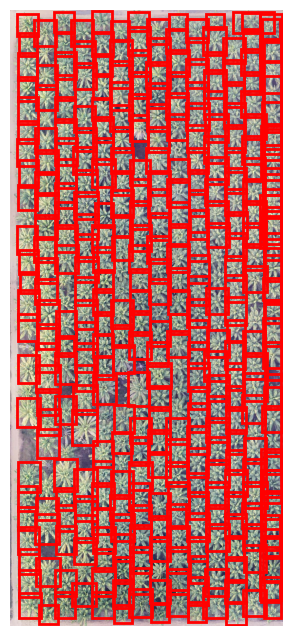

Jumlah objek terdeteksi pada crop 355: 355


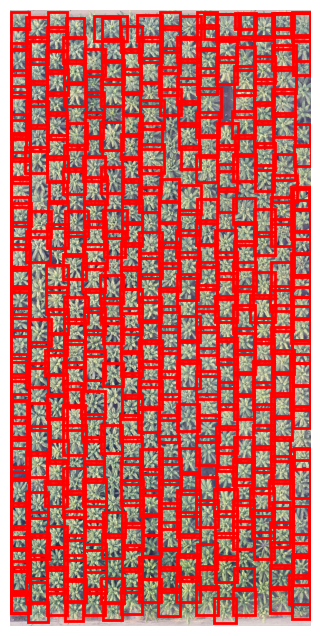

Jumlah objek terdeteksi pada crop 407: 407


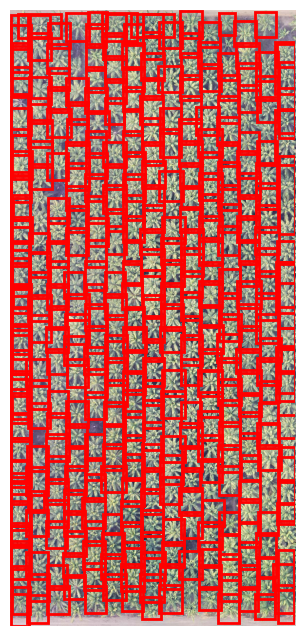

Jumlah objek terdeteksi pada crop 389: 389


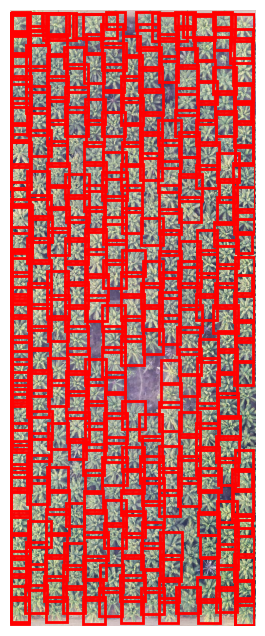

Jumlah objek terdeteksi pada crop 340: 340


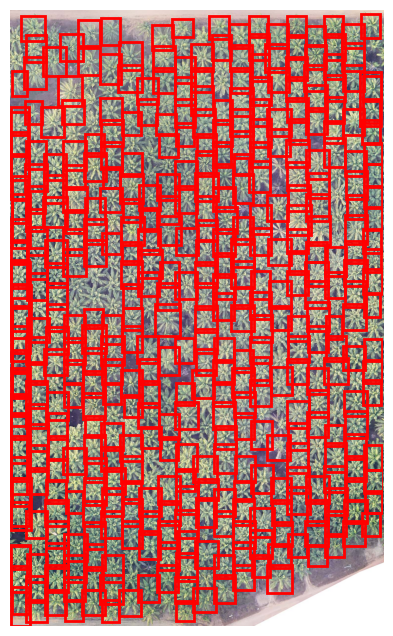

Jumlah objek terdeteksi pada crop 415: 415


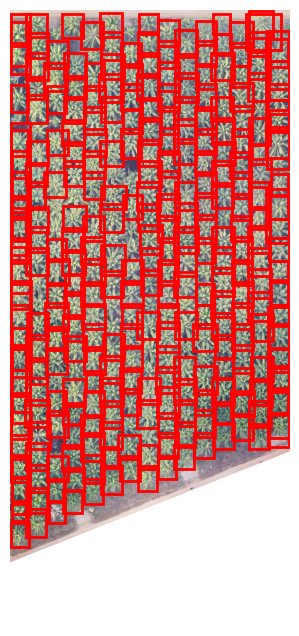

Jumlah objek terdeteksi pada crop 292: 292


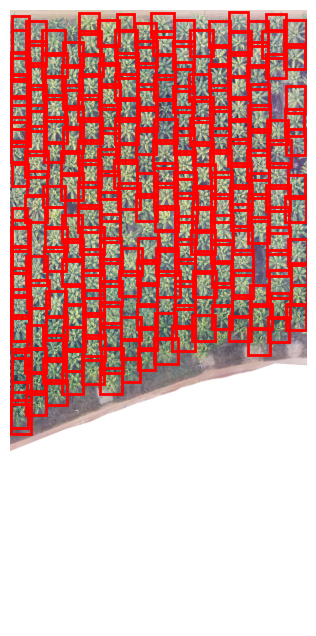

Jumlah objek terdeteksi pada crop 239: 239


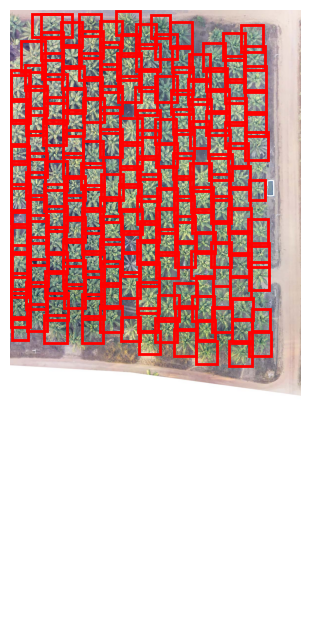

Jumlah objek terdeteksi pada crop 189: 189
Total jumlah objek terdeteksi pada semua crop: 2626


In [ ]:
# Fungsi untuk menghitung crop berdasarkan persentase
def calculate_crop_widths(image_width, percentages):
    crop_widths = []
    start = 0
    for percentage in percentages:
        end = start + int(image_width * percentage)
        crop_widths.append((start, end))
        start = end
    return crop_widths

# Persentase untuk cropping (total harus 1.0)
crop_percentages = [0.1162863722001256, 0.1283232154071593, 0.12172911869374084, 0.10466820180029307, 0.15909566673644546, 0.1193217500523341, 0.12664852417835462, 0.12392715093154699]

# Memuat gambar dan mengurangi resolusi jika terlalu besar
img_path = '/content/SAWIT MESUJI - Good 9554x2510.jpg'
image = Image.open(img_path).convert("RGB")

# Menghitung lebar cropping berdasarkan persentase
crop_widths = calculate_crop_widths(image.width, crop_percentages)

# Fungsi untuk memvisualisasikan gambar dengan kotak prediksi
def plot_image_with_boxes(image, boxes, labels):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        # Menghilangkan label angka, cukup menampilkan string kosong
        ax.text(xmin, ymin, '', fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Menaikkan batas maksimal ukuran gambar untuk mencegah DecompressionBombError
Image.MAX_IMAGE_PIXELS = None

# Fungsi untuk memotong gambar menjadi bagian-bagian
def crop_image(image, crop_widths):
    crops = []
    for start, end in crop_widths:
        cropped_img = image.crop((start, 0, end, image.height))
        crops.append(cropped_img)
    return crops

# Crop gambar
crops = crop_image(image, crop_widths)

# Konversi gambar menjadi tensor
transform = transforms.ToTensor()
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Pastikan model sudah dimuat dan berada dalam mode eval
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_15.pt'))  # Memuat model yang sudah dilatih
model.to(device)
model.eval()

# Threshold untuk prediksi
threshold = 0.01
total_boxes = 0

# Loop untuk deteksi pada setiap crop
for i, crop in enumerate(crops):
    # Konversi crop ke tensor dan tambahkan dimensi batch
    image_tensor = transform(crop).unsqueeze(0).to(device)

    # Melakukan prediksi
    with torch.no_grad():
        pred = model(image_tensor)

    # Menyaring prediksi berdasarkan skor
    pred_boxes = []
    for idx in range(len(pred)):
        for i, score in enumerate(pred[idx]['scores']):
            if score > threshold:
                pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())

    # Menampilkan gambar crop dengan kotak prediksi
    plot_image_with_boxes(crop, pred_boxes, [''] * len(pred_boxes))

    # Menambahkan jumlah box pada total
    num_boxes = len(pred_boxes)
    total_boxes += num_boxes
    print(f"Jumlah objek terdeteksi pada crop {i+1}: {num_boxes}")

# Menampilkan total jumlah objek terdeteksi
print(f"Total jumlah objek terdeteksi pada semua crop: {total_boxes}")


###[2644] CUSTOM 8 CROP FAIR QUALITY

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


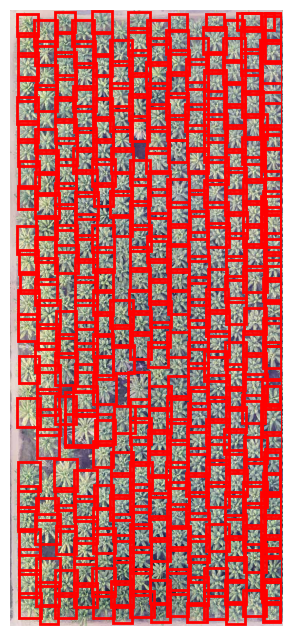

Jumlah objek terdeteksi pada crop 362: 362


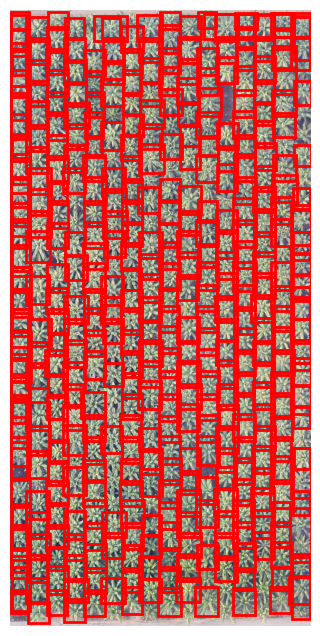

Jumlah objek terdeteksi pada crop 416: 416


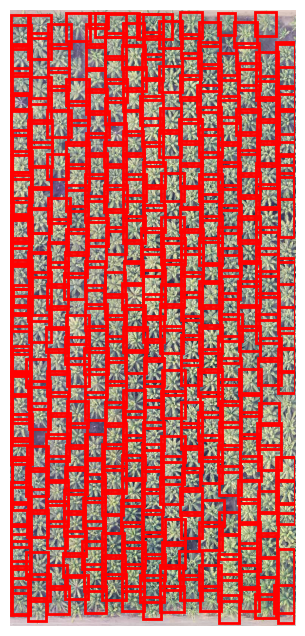

Jumlah objek terdeteksi pada crop 392: 392


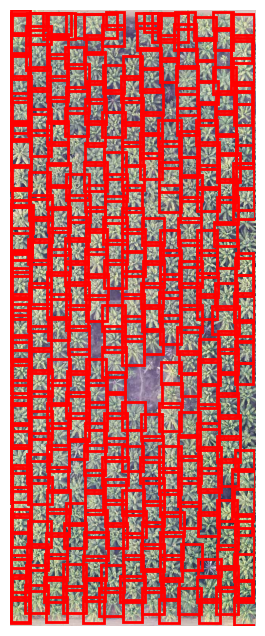

Jumlah objek terdeteksi pada crop 340: 340


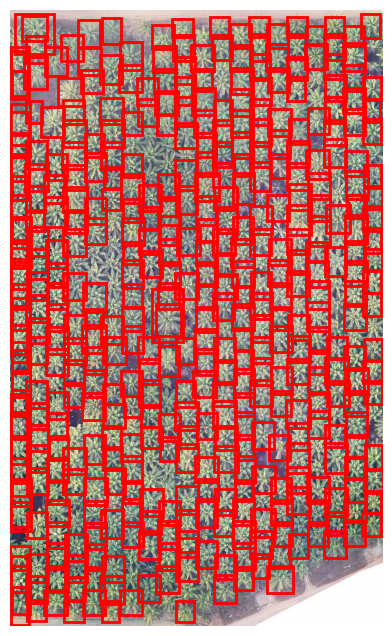

Jumlah objek terdeteksi pada crop 418: 418


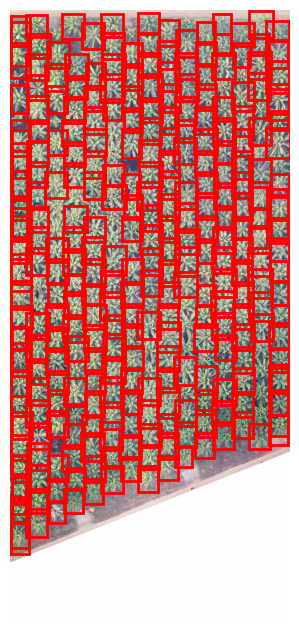

Jumlah objek terdeteksi pada crop 290: 290


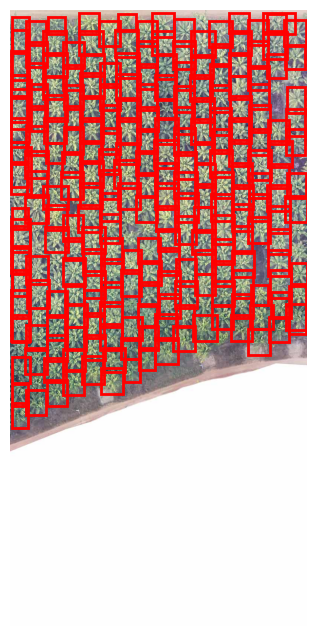

Jumlah objek terdeteksi pada crop 236: 236


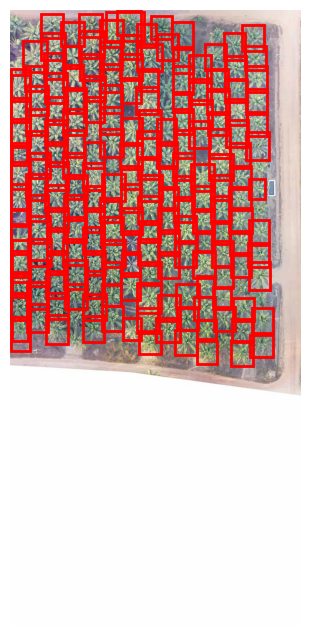

Jumlah objek terdeteksi pada crop 190: 190
Total jumlah objek terdeteksi pada semua crop: 2644


In [ ]:
# Fungsi untuk menghitung crop berdasarkan persentase
def calculate_crop_widths(image_width, percentages):
    crop_widths = []
    start = 0
    for percentage in percentages:
        end = start + int(image_width * percentage)
        crop_widths.append((start, end))
        start = end
    return crop_widths

# Persentase untuk cropping (total harus 1.0)
crop_percentages = [0.1162863722001256, 0.1283232154071593, 0.12172911869374084, 0.10466820180029307, 0.15909566673644546, 0.1193217500523341, 0.12664852417835462, 0.12392715093154699]

# Memuat gambar dan mengurangi resolusi jika terlalu besar
img_path = '/content/SAWIT MESUJI - Fair 6306x1657.jpg'
image = Image.open(img_path).convert("RGB")

# Menghitung lebar cropping berdasarkan persentase
crop_widths = calculate_crop_widths(image.width, crop_percentages)

# Fungsi untuk memvisualisasikan gambar dengan kotak prediksi
def plot_image_with_boxes(image, boxes, labels):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        # Menghilangkan label angka, cukup menampilkan string kosong
        ax.text(xmin, ymin, '', fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Menaikkan batas maksimal ukuran gambar untuk mencegah DecompressionBombError
Image.MAX_IMAGE_PIXELS = None

# Fungsi untuk memotong gambar menjadi bagian-bagian
def crop_image(image, crop_widths):
    crops = []
    for start, end in crop_widths:
        cropped_img = image.crop((start, 0, end, image.height))
        crops.append(cropped_img)
    return crops

# Crop gambar
crops = crop_image(image, crop_widths)

# Konversi gambar menjadi tensor
transform = transforms.ToTensor()
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Pastikan model sudah dimuat dan berada dalam mode eval
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_15.pt'))  # Memuat model yang sudah dilatih
model.to(device)
model.eval()

# Threshold untuk prediksi
threshold = 0.01
total_boxes = 0

# Loop untuk deteksi pada setiap crop
for i, crop in enumerate(crops):
    # Konversi crop ke tensor dan tambahkan dimensi batch
    image_tensor = transform(crop).unsqueeze(0).to(device)

    # Melakukan prediksi
    with torch.no_grad():
        pred = model(image_tensor)

    # Menyaring prediksi berdasarkan skor
    pred_boxes = []
    for idx in range(len(pred)):
        for i, score in enumerate(pred[idx]['scores']):
            if score > threshold:
                pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())

    # Menampilkan gambar crop dengan kotak prediksi
    plot_image_with_boxes(crop, pred_boxes, [''] * len(pred_boxes))

    # Menambahkan jumlah box pada total
    num_boxes = len(pred_boxes)
    total_boxes += num_boxes
    print(f"Jumlah objek terdeteksi pada crop {i+1}: {num_boxes}")

# Menampilkan total jumlah objek terdeteksi
print(f"Total jumlah objek terdeteksi pada semua crop: {total_boxes}")


###[2631] CUSTOM 8 CROP POOR QUALITY

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


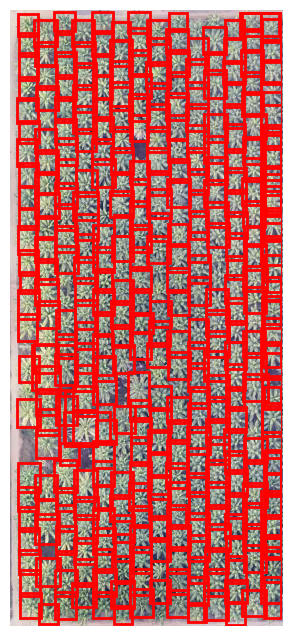

Jumlah objek terdeteksi pada crop 362: 362


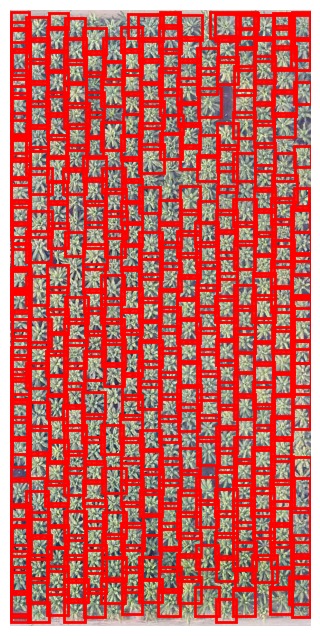

Jumlah objek terdeteksi pada crop 416: 416


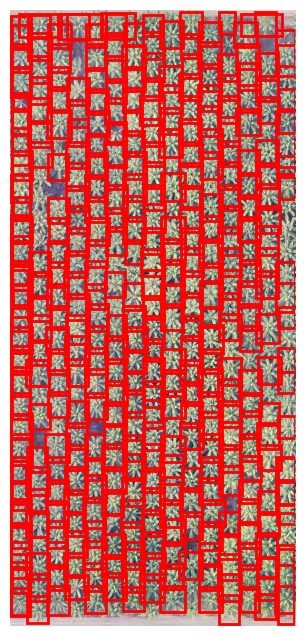

Jumlah objek terdeteksi pada crop 383: 383


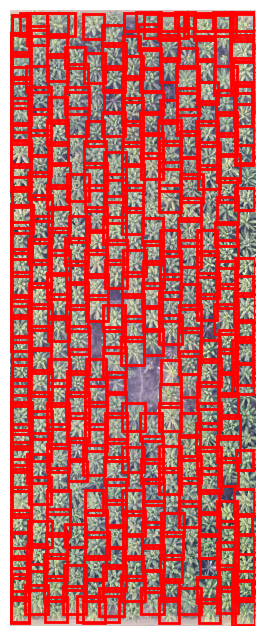

Jumlah objek terdeteksi pada crop 333: 333


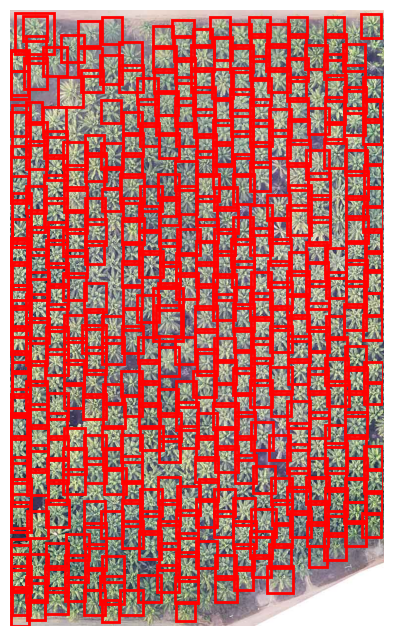

Jumlah objek terdeteksi pada crop 431: 431


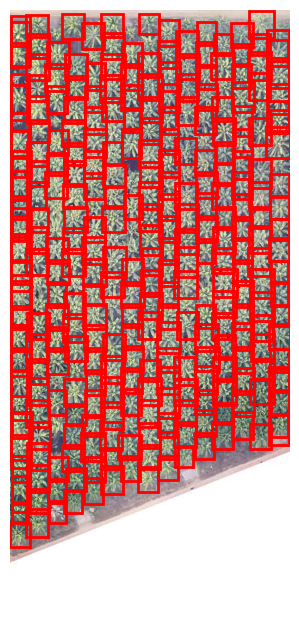

Jumlah objek terdeteksi pada crop 291: 291


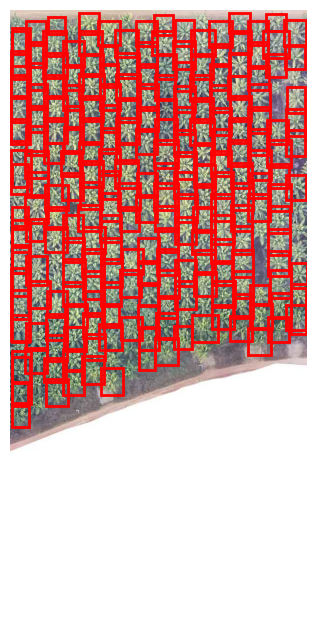

Jumlah objek terdeteksi pada crop 229: 229


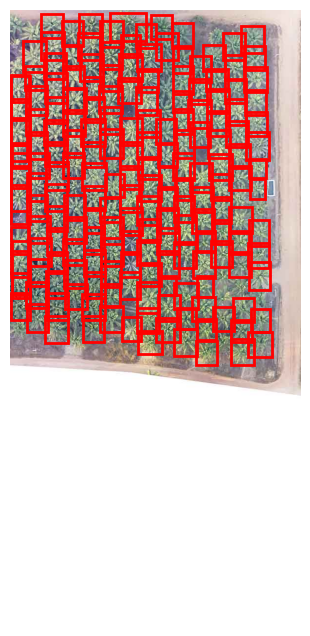

Jumlah objek terdeteksi pada crop 186: 186
Total jumlah objek terdeteksi pada semua crop: 2631


In [ ]:
# Fungsi untuk menghitung crop berdasarkan persentase
def calculate_crop_widths(image_width, percentages):
    crop_widths = []
    start = 0
    for percentage in percentages:
        end = start + int(image_width * percentage)
        crop_widths.append((start, end))
        start = end
    return crop_widths

# Persentase untuk cropping (total harus 1.0)
crop_percentages = [0.1162863722001256, 0.1283232154071593, 0.12172911869374084, 0.10466820180029307, 0.15909566673644546, 0.1193217500523341, 0.12664852417835462, 0.12392715093154699]

# Memuat gambar dan mengurangi resolusi jika terlalu besar
img_path = '/content/SAWIT MESUJI - Poor 4777x1255.jpg'
image = Image.open(img_path).convert("RGB")

# Menghitung lebar cropping berdasarkan persentase
crop_widths = calculate_crop_widths(image.width, crop_percentages)

# Fungsi untuk memvisualisasikan gambar dengan kotak prediksi
def plot_image_with_boxes(image, boxes, labels):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        # Menghilangkan label angka, cukup menampilkan string kosong
        ax.text(xmin, ymin, '', fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Menaikkan batas maksimal ukuran gambar untuk mencegah DecompressionBombError
Image.MAX_IMAGE_PIXELS = None

# Fungsi untuk memotong gambar menjadi bagian-bagian
def crop_image(image, crop_widths):
    crops = []
    for start, end in crop_widths:
        cropped_img = image.crop((start, 0, end, image.height))
        crops.append(cropped_img)
    return crops

# Crop gambar
crops = crop_image(image, crop_widths)

# Konversi gambar menjadi tensor
transform = transforms.ToTensor()
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Pastikan model sudah dimuat dan berada dalam mode eval
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_15.pt'))  # Memuat model yang sudah dilatih
model.to(device)
model.eval()

# Threshold untuk prediksi
threshold = 0.01
total_boxes = 0

# Loop untuk deteksi pada setiap crop
for i, crop in enumerate(crops):
    # Konversi crop ke tensor dan tambahkan dimensi batch
    image_tensor = transform(crop).unsqueeze(0).to(device)

    # Melakukan prediksi
    with torch.no_grad():
        pred = model(image_tensor)

    # Menyaring prediksi berdasarkan skor
    pred_boxes = []
    for idx in range(len(pred)):
        for i, score in enumerate(pred[idx]['scores']):
            if score > threshold:
                pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())

    # Menampilkan gambar crop dengan kotak prediksi
    plot_image_with_boxes(crop, pred_boxes, [''] * len(pred_boxes))

    # Menambahkan jumlah box pada total
    num_boxes = len(pred_boxes)
    total_boxes += num_boxes
    print(f"Jumlah objek terdeteksi pada crop {i+1}: {num_boxes}")

# Menampilkan total jumlah objek terdeteksi
print(f"Total jumlah objek terdeteksi pada semua crop: {total_boxes}")


### [1815] CUSTOM 8 CROP VERY POOR QUALITY

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


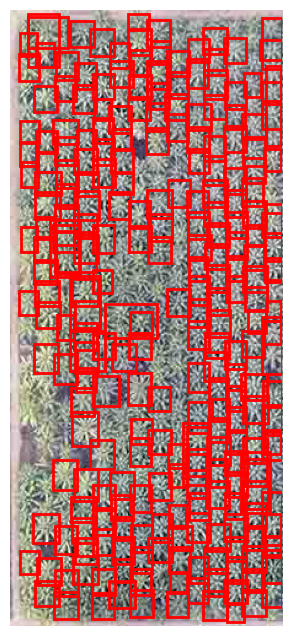

Jumlah objek terdeteksi pada crop 255: 255


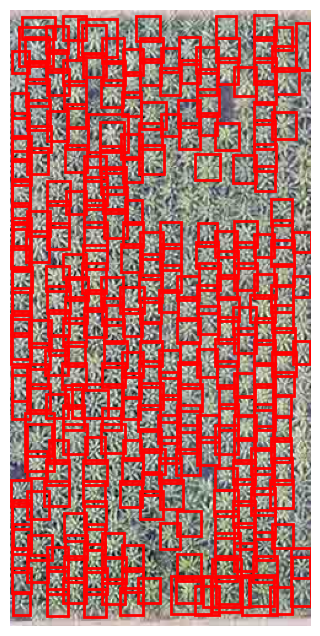

Jumlah objek terdeteksi pada crop 301: 301


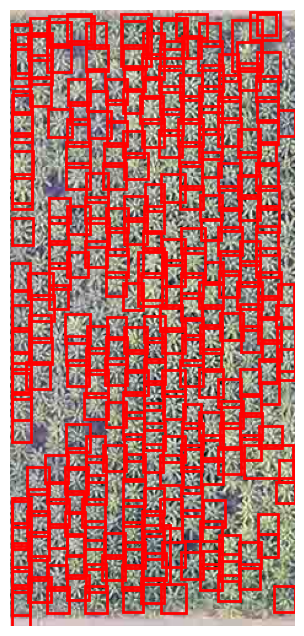

Jumlah objek terdeteksi pada crop 289: 289


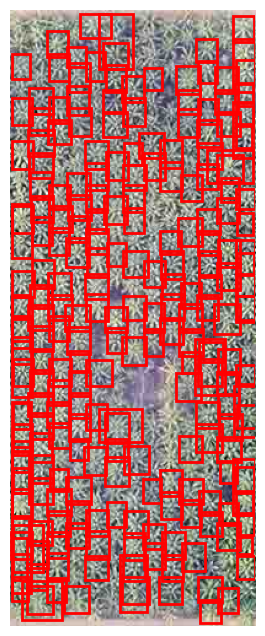

Jumlah objek terdeteksi pada crop 229: 229


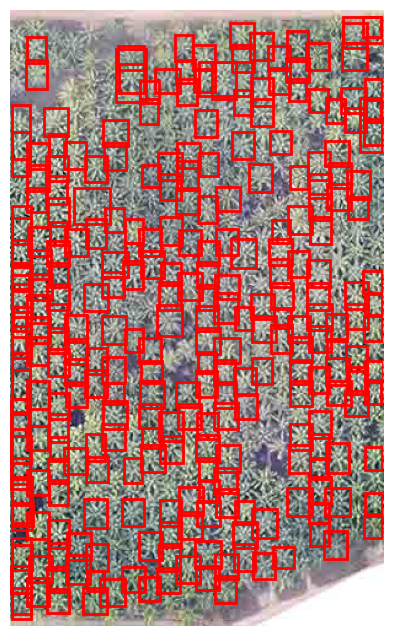

Jumlah objek terdeteksi pada crop 274: 274


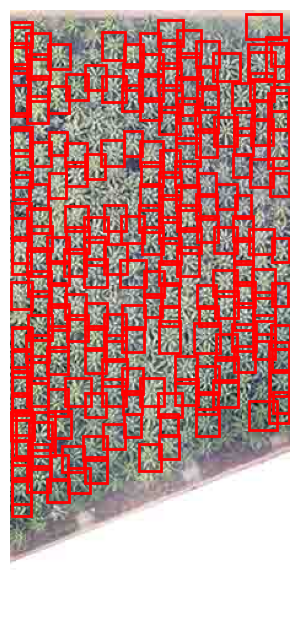

Jumlah objek terdeteksi pada crop 206: 206


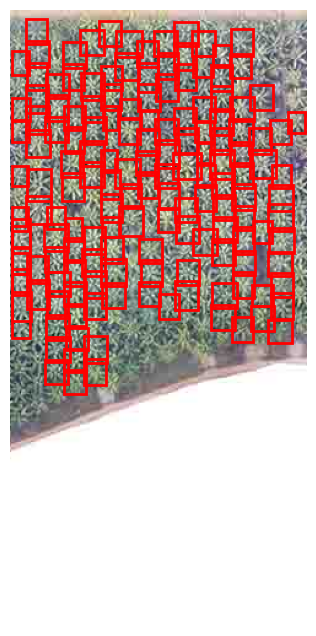

Jumlah objek terdeteksi pada crop 153: 153


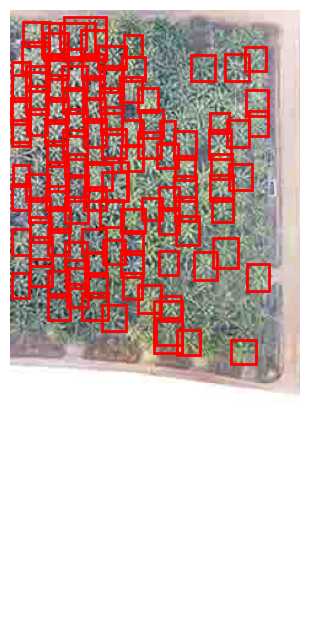

Jumlah objek terdeteksi pada crop 108: 108
Total jumlah objek terdeteksi pada semua crop: 1815


In [ ]:
# Fungsi untuk menghitung crop berdasarkan persentase
def calculate_crop_widths(image_width, percentages):
    crop_widths = []
    start = 0
    for percentage in percentages:
        end = start + int(image_width * percentage)
        crop_widths.append((start, end))
        start = end
    return crop_widths

# Persentase untuk cropping (total harus 1.0)
crop_percentages = [0.1162863722001256, 0.1283232154071593, 0.12172911869374084, 0.10466820180029307, 0.15909566673644546, 0.1193217500523341, 0.12664852417835462, 0.12392715093154699]

# Memuat gambar dan mengurangi resolusi jika terlalu besar
img_path = '/content/SAWIT MESUJI - very poor 1911x502.jpg'
image = Image.open(img_path).convert("RGB")

# Menghitung lebar cropping berdasarkan persentase
crop_widths = calculate_crop_widths(image.width, crop_percentages)

# Fungsi untuk memvisualisasikan gambar dengan kotak prediksi
def plot_image_with_boxes(image, boxes, labels):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        # Menghilangkan label angka, cukup menampilkan string kosong
        ax.text(xmin, ymin, '', fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Menaikkan batas maksimal ukuran gambar untuk mencegah DecompressionBombError
Image.MAX_IMAGE_PIXELS = None

# Fungsi untuk memotong gambar menjadi bagian-bagian
def crop_image(image, crop_widths):
    crops = []
    for start, end in crop_widths:
        cropped_img = image.crop((start, 0, end, image.height))
        crops.append(cropped_img)
    return crops

# Crop gambar
crops = crop_image(image, crop_widths)

# Konversi gambar menjadi tensor
transform = transforms.ToTensor()
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Pastikan model sudah dimuat dan berada dalam mode eval
model = get_model_instance_segmentation(2)  # Menggunakan 2 kelas (1 objek + background)
model.load_state_dict(torch.load('model_15.pt'))  # Memuat model yang sudah dilatih
model.to(device)
model.eval()

# Threshold untuk prediksi
threshold = 0.01
total_boxes = 0

# Loop untuk deteksi pada setiap crop
for i, crop in enumerate(crops):
    # Konversi crop ke tensor dan tambahkan dimensi batch
    image_tensor = transform(crop).unsqueeze(0).to(device)

    # Melakukan prediksi
    with torch.no_grad():
        pred = model(image_tensor)

    # Menyaring prediksi berdasarkan skor
    pred_boxes = []
    for idx in range(len(pred)):
        for i, score in enumerate(pred[idx]['scores']):
            if score > threshold:
                pred_boxes.append(pred[idx]['boxes'][i].cpu().numpy())

    # Menampilkan gambar crop dengan kotak prediksi
    plot_image_with_boxes(crop, pred_boxes, [''] * len(pred_boxes))

    # Menambahkan jumlah box pada total
    num_boxes = len(pred_boxes)
    total_boxes += num_boxes
    print(f"Jumlah objek terdeteksi pada crop {i+1}: {num_boxes}")

# Menampilkan total jumlah objek terdeteksi
print(f"Total jumlah objek terdeteksi pada semua crop: {total_boxes}")
